<h1 style="background-color:#5DADE2;font-size:350%;text-align:center;border-radius: 50px 50px;padding: 15px;color:white;">Moroccan Money Classification using Deep Learning Models</h1>

<img src="https://user-images.githubusercontent.com/70811337/157852555-523ec70a-8a01-461e-953c-178266871cbd.jpg" alt="Paris" style="display: block;
  margin-left: auto;
  margin-right: auto;">

<h2 style="width: 100%;
    margin: 0;
    padding: 0;
    text-align: center;">----< Table of contents >----</h2>

1. [Importing Libraries](#1)
2. [Load Dataset](#2)
3. [EDA & Visualization](#3)
4. [Train & Test Split](#4)
5. [Function](#5)
6. [Training models](#6)
  <ul>
      <li>✔️ ResNet50 </li>
      <li>✔️ ResNet101</li>
      <li>✔️ ResNet152</li>
      <li>✔️ VGG16</li>
      <li>✔️ VGG19</li>
      <li>✔️ MobileNet</li>
      <li>✔️ MobileNetV2</li>
      <li>✔️ DenseNet201</li>
      <li>✔️ EfficientNetB7</li>
      <li>✔️ InceptionV3</li>
      <li>✔️ NASNetLarge</li>
      <li>✔️ NASNetMobile</li>
      <li>✔️ ResNet101V2</li>
  </ul>
8. [Final Report](#7)

<a id="1"></a> <br>
# 📥 Importing Libraries

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback, EarlyStopping
from sklearn.metrics import confusion_matrix, classification_report

<a id="2"></a> <br> 
# 🗃️ Load Dataset

In [2]:
path = '../input/moroccan-money-dataset/Moroccan Money dataset'
path_img = list(glob.glob(path+'/**/*.jpg'))

In [3]:
labels = list(map(lambda x:os.path.split(os.path.split(x)[0])[1], path_img))
file_path = pd.Series(path_img, name='File_Path').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([file_path, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head()

,File_Path,Labels
0,../input/moroccan-money-dataset/Moroccan Money...,1
1,../input/moroccan-money-dataset/Moroccan Money...,5
2,../input/moroccan-money-dataset/Moroccan Money...,20
3,../input/moroccan-money-dataset/Moroccan Money...,1
4,../input/moroccan-money-dataset/Moroccan Money...,0.1


<a id="3"></a> <br>
# 🔥 EDA & Visualization

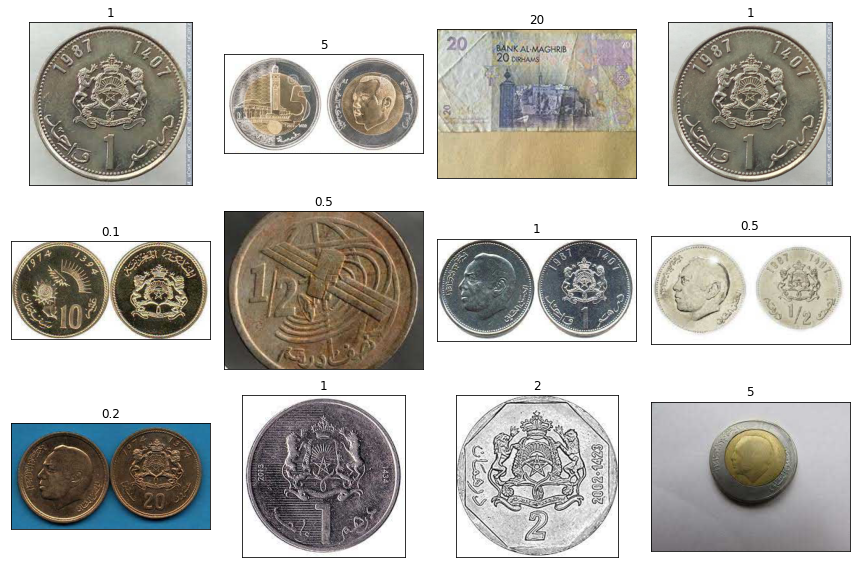

In [4]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 8),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data.File_Path[i]))
    ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()

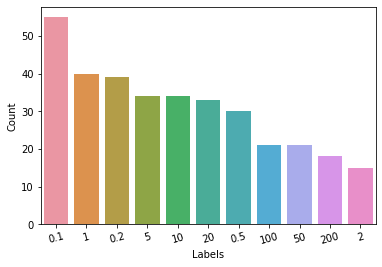

In [5]:
counts = data.Labels.value_counts()
sns.barplot(x=counts.index, y=counts)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=15);

In [6]:
print(f"True: \nPredicted:\033[32m ancd \033[0m")

True: 
Predicted: ancd 


<a id="4"></a> <br>
# ✂️ Train & Test Split

In [7]:
train_df, test_df = train_test_split(data, test_size=0.2, random_state=42)

<a id="5"></a> <br>
# 🦾 Function

In [8]:
def func(pre,name_model,size):
    train_datagen = ImageDataGenerator(preprocessing_function=pre, validation_split=0.2)
    test_datagen = ImageDataGenerator(preprocessing_function=pre)
    
    train_gen = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        x_col='File_Path',
        y_col='Labels',
        target_size=(size,size),
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='training',
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest")
    valid_gen = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        x_col='File_Path',
        y_col='Labels',
        target_size=(size,size),
        class_mode='categorical',
        batch_size=32,
        shuffle=False,
        seed=0,
        subset='validation',
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest")
    test_gen = test_datagen.flow_from_dataframe(
        dataframe=test_df,
        x_col='File_Path',
        y_col='Labels',
        target_size=(size,size),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        verbose=0,
        shuffle=False)
    
    pre_model = name_model(input_shape=(size,size, 3),
                   include_top=False,
                   weights='imagenet',
                   pooling='avg')
    pre_model.trainable = False
    inputs = pre_model.input
    x = Dense(64, activation='relu')(pre_model.output)
    x = Dense(64, activation='relu')(x)
    outputs = Dense(11, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss = 'categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])
    my_callbacks  = [EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=3,
                              mode='auto')]
    
    history = model.fit(train_gen,validation_data=valid_gen,epochs=100,callbacks=my_callbacks,verbose=0);
    print('\033[01m              Plotting Accuracy, val_accuracy, loss, val_loss \033[0m')
    # Plotting Accuracy, val_accuracy, loss, val_loss
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax = ax.ravel()

    for i, met in enumerate(['accuracy', 'loss']):
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('Model {}'.format(met))
        ax[i].set_xlabel('epochs')
        ax[i].set_ylabel(met)
        ax[i].legend(['Train', 'Validation'])
    plt.show()
    
    # Predict Data Test
    pred = model.predict(test_gen )
    pred = np.argmax(pred,axis=1)
    labels = (train_gen.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]
    
    print('\033[01m              Classification_report \033[0m')
    cm=confusion_matrix(test_df.Labels,pred)
    clr = classification_report(test_df.Labels, pred)
    print(clr)
    print('\033[01m Display 8 pictures of the dataset with their labels \033[0m')
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 8),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(test_df.File_Path.iloc[i+1]))
        if (test_df.Labels.iloc[i+1]==pred[i+1]):
            ax.set_title(f"True: {test_df.Labels.iloc[i+1]}\nPredicted:{pred[i+1]}",color ="green",fontweight ="bold")
        else:
            ax.set_title(f"True: {test_df.Labels.iloc[i+1]}\nPredicted: {pred[i+1]}",color ="red",fontweight ="bold")#\033[31m
    plt.tight_layout()
    plt.show()
    
    print('\033[01m              Results \033[0m')
    results = model.evaluate(test_gen, verbose=0)
    print("    Test Loss:\033[31m \033[01m {:.5f} \033[30m \033[0m".format(results[0]))
    print("Test Accuracy:\033[32m \033[01m {:.2f}% \033[30m \033[0m".format(results[1] * 100))
    
    return results

<a id="6"></a> <br>
# 📚 Training models

In [9]:
accuracy_test=[]

# ✔️ ResNet50

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.


2022-03-18 16:33:53.378841: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


94781440/94765736 [==============================] - 1s 0us/step


2022-03-18 16:33:56.093610: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


              Plotting Accuracy, val_accuracy, loss, val_loss 


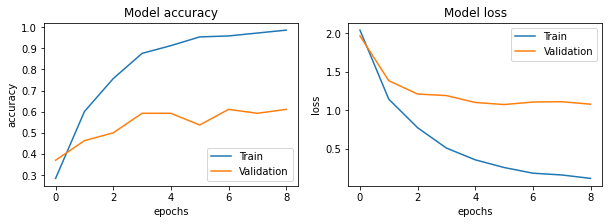

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.50      0.58      0.54        12
         0.2       0.30      0.38      0.33         8
         0.5       1.00      0.33      0.50         6
           1       0.64      0.90      0.75        10
          10       1.00      0.60      0.75         5
         100       0.50      1.00      0.67         2
           2       0.50      0.33      0.40         3
          20       1.00      0.75      0.86         8
         200       1.00      1.00      1.00         1
           5       0.80      0.67      0.73         6
          50       0.86      0.86      0.86         7

    accuracy                           0.65        68
   macro avg       0.74      0.67      0.67        68
weighted avg       0.71      0.65      0.65        68

 Display 8 pictures of the dataset with their labels 


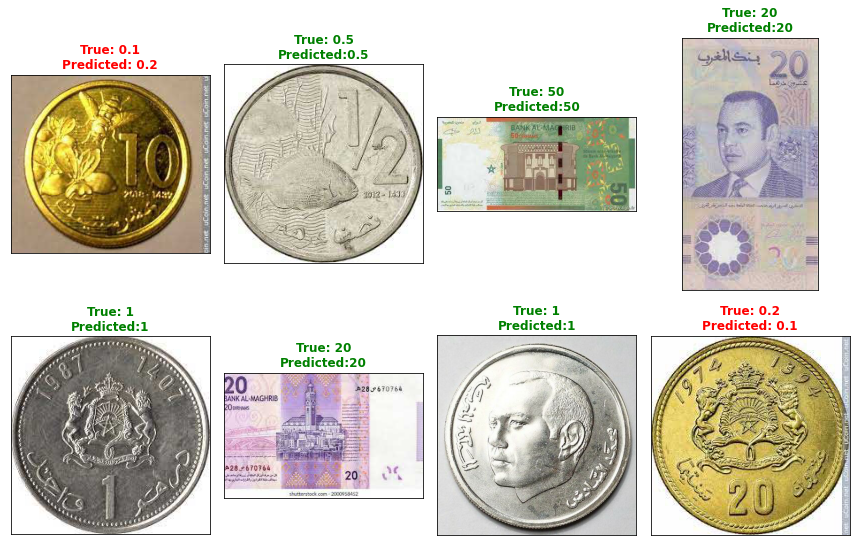

              Results 
    Test Loss:  1.11509  
Test Accuracy:  64.71%  


In [10]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
result_ResNet50 = func(preprocess_input,ResNet50,100)
accuracy_test.append(result_ResNet50[1])

# ✔️ ResNet101

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
171458560/171446536 [==============================] - 1s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


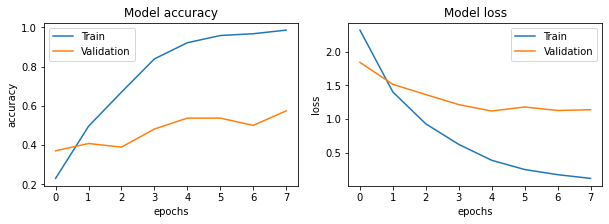

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.58      0.92      0.71        12
         0.2       0.75      0.38      0.50         8
         0.5       0.50      0.33      0.40         6
           1       0.67      0.80      0.73        10
          10       0.80      0.80      0.80         5
         100       0.40      1.00      0.57         2
           2       1.00      0.33      0.50         3
          20       1.00      0.88      0.93         8
         200       1.00      1.00      1.00         1
           5       1.00      0.83      0.91         6
          50       1.00      0.71      0.83         7

    accuracy                           0.72        68
   macro avg       0.79      0.73      0.72        68
weighted avg       0.77      0.72      0.71        68

 Display 8 pictures of the dataset with their labels 


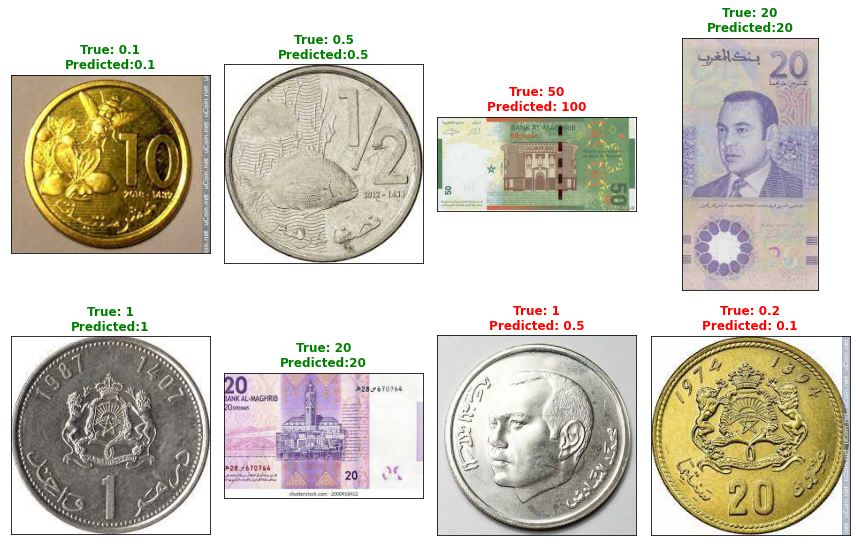

              Results 
    Test Loss:  0.78729  
Test Accuracy:  72.06%  


In [11]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.applications.resnet import preprocess_input
result_ResNet101 = func(preprocess_input,ResNet101,100)
accuracy_test.append(result_ResNet101[1])

# ✔️ ResNet152

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
234708992/234698864 [==============================] - 2s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


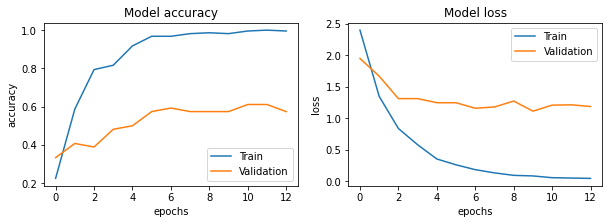

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.71      0.83      0.77        12
         0.2       0.57      0.50      0.53         8
         0.5       0.57      0.67      0.62         6
           1       0.78      0.70      0.74        10
          10       0.57      0.80      0.67         5
         100       1.00      1.00      1.00         2
           2       1.00      0.33      0.50         3
          20       0.88      0.88      0.88         8
         200       0.25      1.00      0.40         1
           5       0.80      0.67      0.73         6
          50       1.00      0.57      0.73         7

    accuracy                           0.71        68
   macro avg       0.74      0.72      0.69        68
weighted avg       0.75      0.71      0.71        68

 Display 8 pictures of the dataset with their labels 


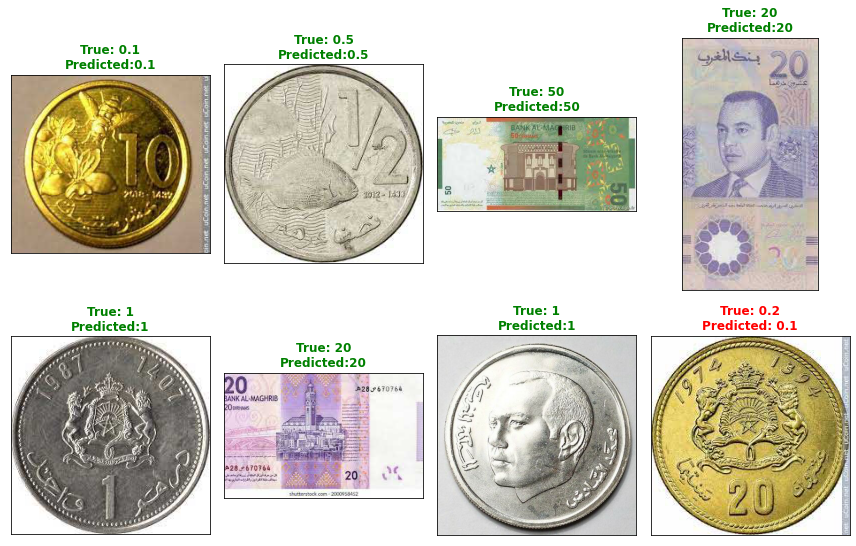

              Results 
    Test Loss:  1.07635  
Test Accuracy:  70.59%  


In [12]:
from tensorflow.keras.applications import ResNet152
from tensorflow.keras.applications.resnet import preprocess_input
result_ResNet152 = func(preprocess_input,ResNet152,100)
accuracy_test.append(result_ResNet152[1])

# ✔️ VGG16

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
58900480/58889256 [==============================] - 0s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


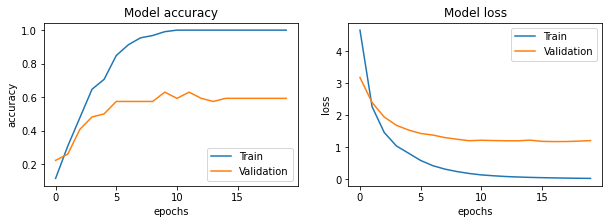

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.60      0.75      0.67        12
         0.2       0.60      0.38      0.46         8
         0.5       0.67      0.33      0.44         6
           1       0.64      0.90      0.75        10
          10       0.80      0.80      0.80         5
         100       0.33      1.00      0.50         2
           2       1.00      0.67      0.80         3
          20       0.80      0.50      0.62         8
         200       0.00      0.00      0.00         1
           5       0.67      0.67      0.67         6
          50       0.75      0.43      0.55         7

    accuracy                           0.62        68
   macro avg       0.62      0.58      0.57        68
weighted avg       0.67      0.62      0.62        68

 Display 8 pictures of the dataset with their labels 


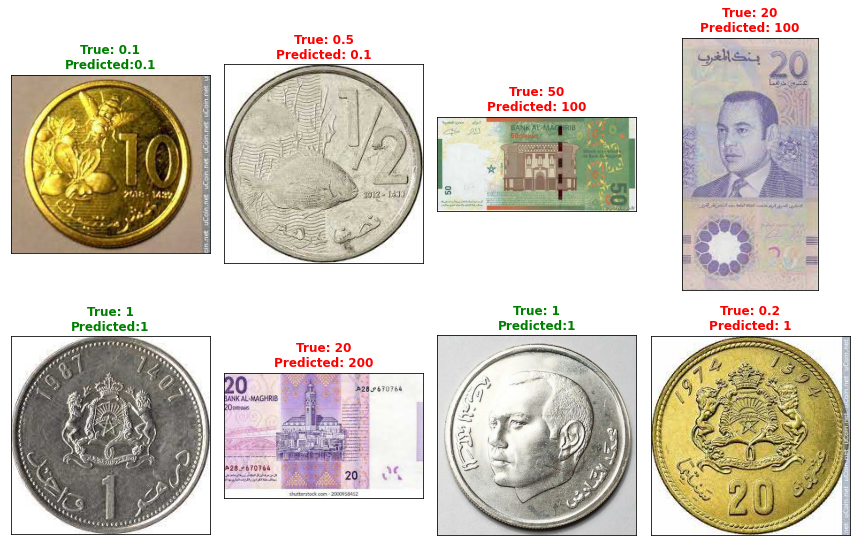

              Results 
    Test Loss:  1.32879  
Test Accuracy:  61.76%  


In [13]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
result_VGG16 = func(preprocess_input,VGG16,224)
accuracy_test.append(result_VGG16[1])

# ✔️ VGG19

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
80150528/80134624 [==============================] - 0s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


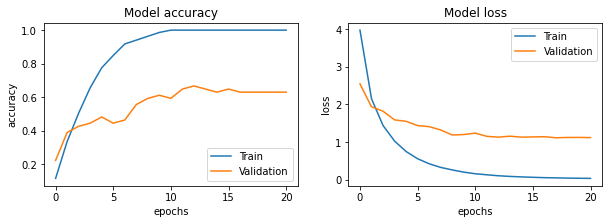

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.69      0.75      0.72        12
         0.2       0.50      0.38      0.43         8
         0.5       0.75      0.50      0.60         6
           1       0.62      0.80      0.70        10
          10       0.43      0.60      0.50         5
         100       1.00      1.00      1.00         2
           2       1.00      0.33      0.50         3
          20       0.88      0.88      0.88         8
         200       0.00      0.00      0.00         1
           5       0.50      0.50      0.50         6
          50       0.75      0.43      0.55         7

    accuracy                           0.62        68
   macro avg       0.65      0.56      0.58        68
weighted avg       0.67      0.62      0.62        68

 Display 8 pictures of the dataset with their labels 


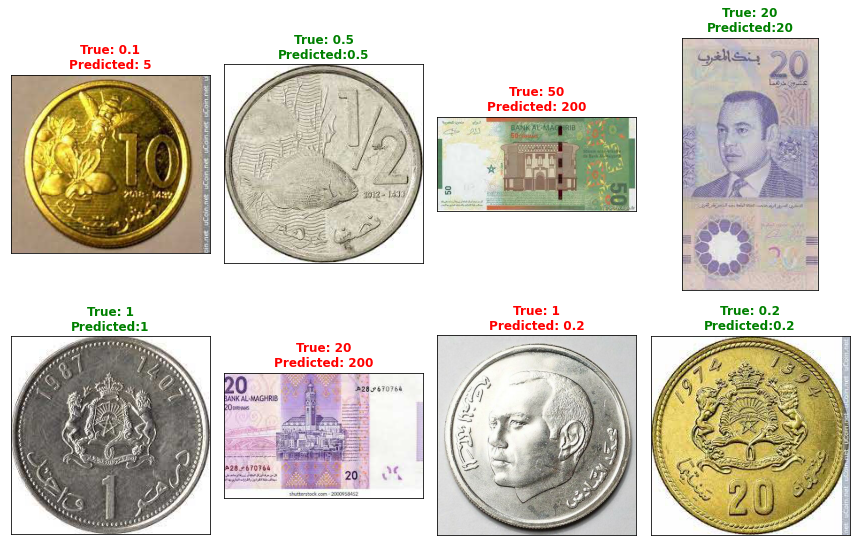

              Results 
    Test Loss:  1.31514  
Test Accuracy:  61.76%  


In [14]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
result_VGG19 = func(preprocess_input,VGG19,224)
accuracy_test.append(result_VGG19[1])

# ✔️ MobileNet

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
17235968/17225924 [==============================] - 0s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


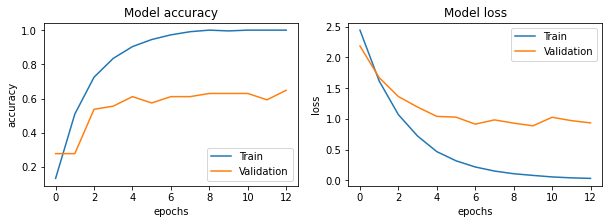

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.69      0.75      0.72        12
         0.2       0.50      0.50      0.50         8
         0.5       0.25      0.17      0.20         6
           1       0.86      0.60      0.71        10
          10       0.71      1.00      0.83         5
         100       0.50      1.00      0.67         2
           2       0.50      0.67      0.57         3
          20       0.62      0.62      0.62         8
         200       0.00      0.00      0.00         1
           5       0.71      0.83      0.77         6
          50       0.60      0.43      0.50         7

    accuracy                           0.62        68
   macro avg       0.54      0.60      0.55        68
weighted avg       0.62      0.62      0.61        68

 Display 8 pictures of the dataset with their labels 


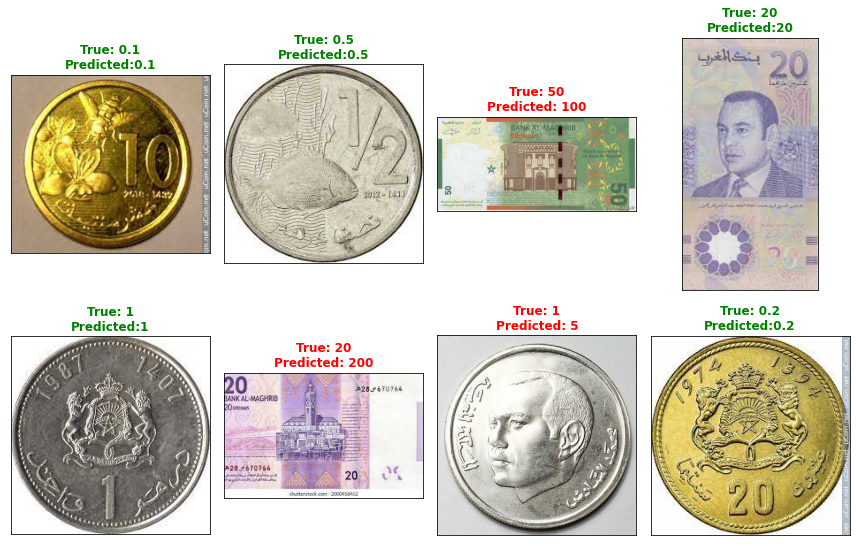

              Results 
    Test Loss:  1.08483  
Test Accuracy:  61.76%  


In [15]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
result_MobileNet = func(preprocess_input,MobileNet,100)
accuracy_test.append(result_MobileNet[1])

# ✔️ MobileNetV2

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
9420800/9406464 [==============================] - 0s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


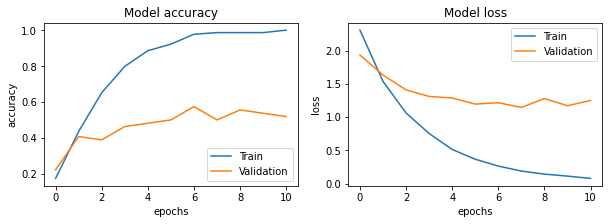

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.54      0.58      0.56        12
         0.2       0.33      0.38      0.35         8
         0.5       1.00      0.33      0.50         6
           1       0.64      0.90      0.75        10
          10       0.83      1.00      0.91         5
         100       0.40      1.00      0.57         2
           2       0.00      0.00      0.00         3
          20       0.62      0.62      0.62         8
         200       0.00      0.00      0.00         1
           5       0.83      0.83      0.83         6
          50       1.00      0.43      0.60         7

    accuracy                           0.60        68
   macro avg       0.56      0.55      0.52        68
weighted avg       0.64      0.60      0.59        68

 Display 8 pictures of the dataset with their labels 


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


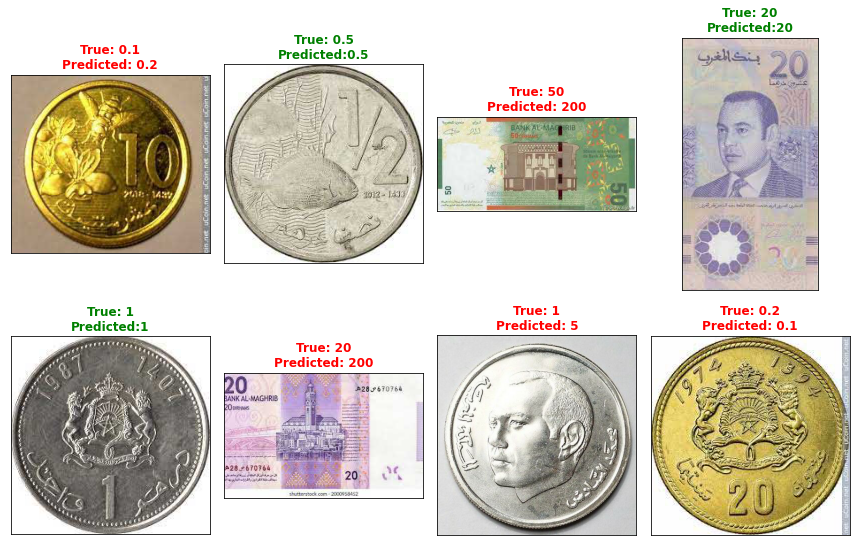

              Results 
    Test Loss:  1.30673  
Test Accuracy:  60.29%  


In [16]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
result_MobileNetV2 = func(preprocess_input,MobileNetV2,100)
accuracy_test.append(result_MobileNetV2[1])

# ✔️ DenseNet201

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
74850304/74836368 [==============================] - 1s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


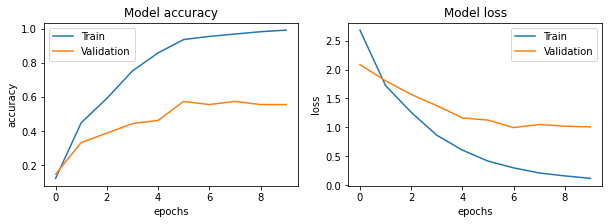

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.59      0.83      0.69        12
         0.2       0.60      0.38      0.46         8
         0.5       0.50      0.50      0.50         6
           1       0.73      0.80      0.76        10
          10       0.75      0.60      0.67         5
         100       1.00      1.00      1.00         2
           2       1.00      0.33      0.50         3
          20       0.88      0.88      0.88         8
         200       0.20      1.00      0.33         1
           5       0.83      0.83      0.83         6
          50       1.00      0.43      0.60         7

    accuracy                           0.68        68
   macro avg       0.73      0.69      0.66        68
weighted avg       0.74      0.68      0.68        68

 Display 8 pictures of the dataset with their labels 


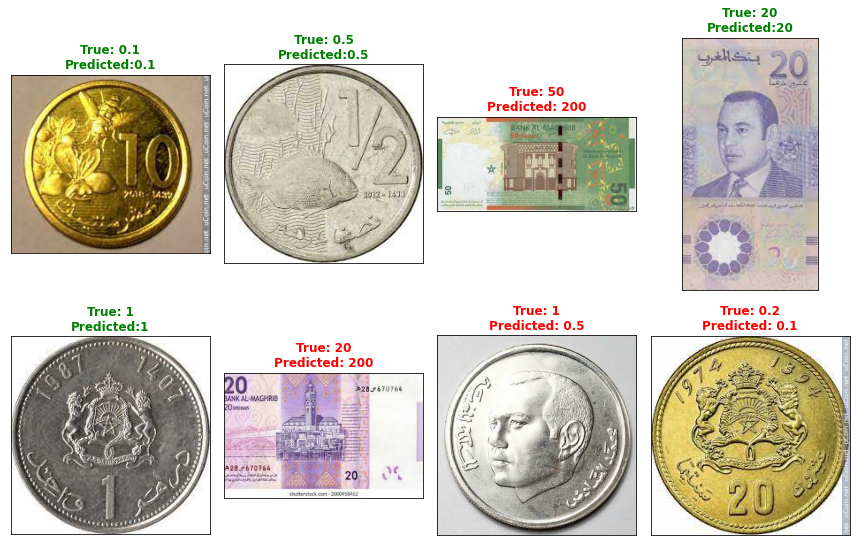

              Results 
    Test Loss:  0.84243  
Test Accuracy:  67.65%  


In [17]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input
result_DenseNet201 = func(preprocess_input,DenseNet201,100)
accuracy_test.append(result_DenseNet201[1])

# ✔️ EfficientNetB7

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
258088960/258076736 [==============================] - 2s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


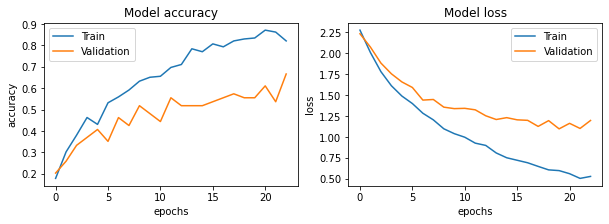

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.41      1.00      0.59        12
         0.2       0.00      0.00      0.00         8
         0.5       0.00      0.00      0.00         6
           1       0.78      0.70      0.74        10
          10       1.00      0.80      0.89         5
         100       1.00      1.00      1.00         2
           2       0.00      0.00      0.00         3
          20       0.70      0.88      0.78         8
         200       0.00      0.00      0.00         1
           5       0.56      0.83      0.67         6
          50       0.67      0.29      0.40         7

    accuracy                           0.57        68
   macro avg       0.46      0.50      0.46        68
weighted avg       0.49      0.57      0.50        68

 Display 8 pictures of the dataset with their labels 


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


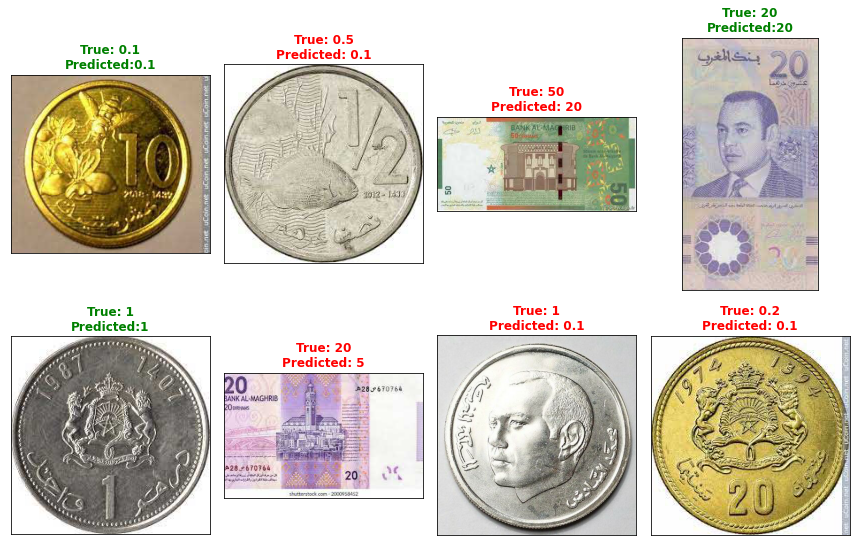

              Results 
    Test Loss:  1.07254  
Test Accuracy:  57.35%  


In [18]:
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input
result_Eff = func(preprocess_input,EfficientNetB7,100)
accuracy_test.append(result_Eff[1])

# ✔️ InceptionV3

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
87924736/87910968 [==============================] - 1s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


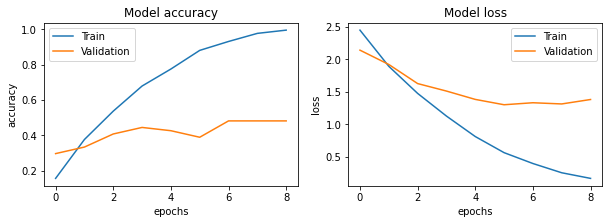

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.35      0.50      0.41        12
         0.2       0.14      0.12      0.13         8
         0.5       0.40      0.33      0.36         6
           1       0.70      0.70      0.70        10
          10       0.60      0.60      0.60         5
         100       1.00      0.50      0.67         2
           2       1.00      0.33      0.50         3
          20       0.86      0.75      0.80         8
         200       0.25      1.00      0.40         1
           5       0.60      0.50      0.55         6
          50       0.83      0.71      0.77         7

    accuracy                           0.53        68
   macro avg       0.61      0.55      0.54        68
weighted avg       0.58      0.53      0.54        68

 Display 8 pictures of the dataset with their labels 


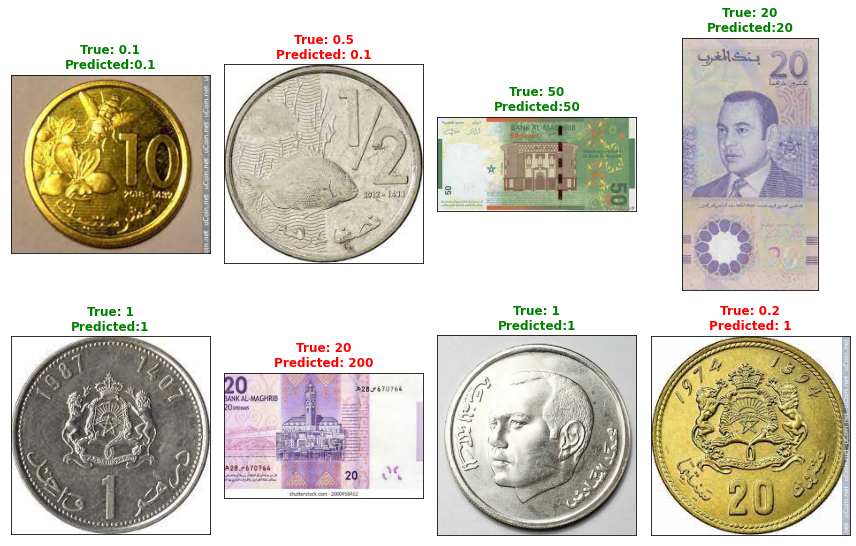

              Results 
    Test Loss:  1.32658  
Test Accuracy:  52.94%  


In [19]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
result_InceptionV3 = func(preprocess_input,InceptionV3,100)
accuracy_test.append(result_InceptionV3[1])

# ✔️ NASNetLarge

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
343621632/343610240 [==============================] - 3s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


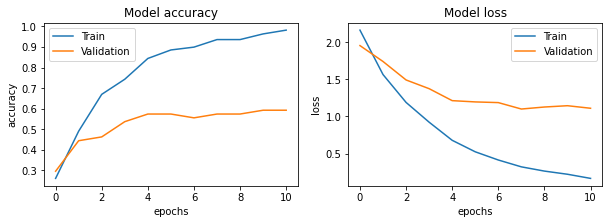

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.78      0.58      0.67        12
         0.2       0.42      0.62      0.50         8
         0.5       0.67      0.33      0.44         6
           1       0.73      0.80      0.76        10
          10       0.00      0.00      0.00         5
         100       0.67      1.00      0.80         2
           2       1.00      0.67      0.80         3
          20       0.67      0.75      0.71         8
         200       0.33      1.00      0.50         1
           5       0.55      1.00      0.71         6
          50       0.67      0.29      0.40         7

    accuracy                           0.60        68
   macro avg       0.59      0.64      0.57        68
weighted avg       0.62      0.60      0.58        68

 Display 8 pictures of the dataset with their labels 


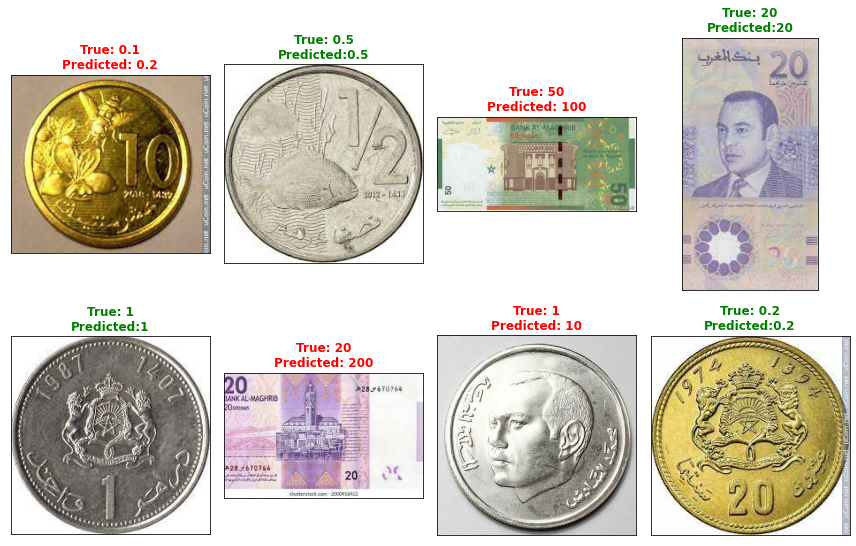

              Results 
    Test Loss:  1.04943  
Test Accuracy:  60.29%  


In [20]:
from tensorflow.keras.applications import NASNetLarge
from tensorflow.keras.applications.nasnet import preprocess_input
result_NASNetLarge = func(preprocess_input,NASNetLarge,331)
accuracy_test.append(result_NASNetLarge[1])

# ✔️ NASNetMobile

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
20004864/19993432 [==============================] - 0s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


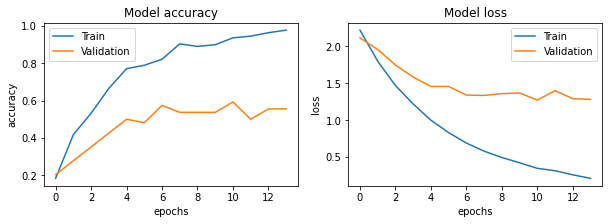

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.62      0.67      0.64        12
         0.2       0.38      0.38      0.38         8
         0.5       0.43      0.50      0.46         6
           1       0.82      0.90      0.86        10
          10       0.43      0.60      0.50         5
         100       0.67      1.00      0.80         2
           2       1.00      0.33      0.50         3
          20       0.60      0.75      0.67         8
         200       0.33      1.00      0.50         1
           5       0.67      0.33      0.44         6
          50       1.00      0.29      0.44         7

    accuracy                           0.59        68
   macro avg       0.63      0.61      0.56        68
weighted avg       0.64      0.59      0.58        68

 Display 8 pictures of the dataset with their labels 


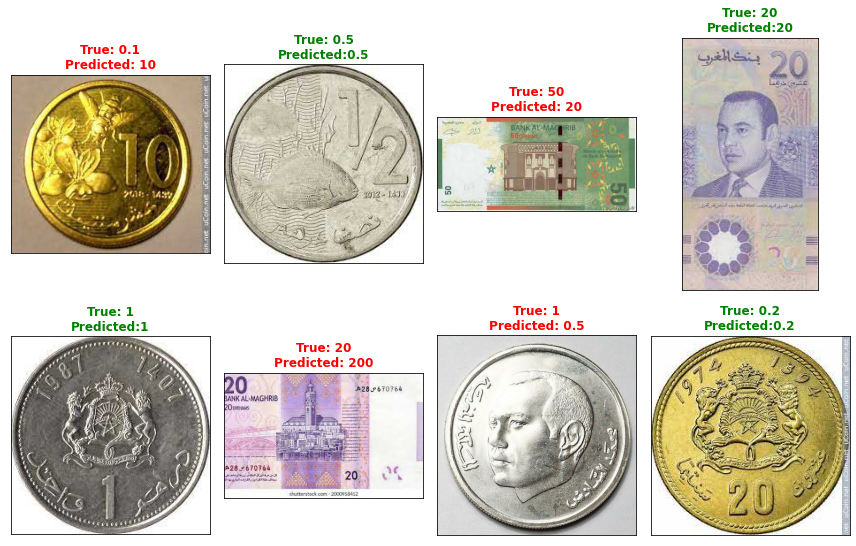

              Results 
    Test Loss:  1.12317  
Test Accuracy:  58.82%  


In [21]:
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.applications.nasnet import preprocess_input
result_NASNetMobile = func(preprocess_input,NASNetMobile,224)
accuracy_test.append(result_NASNetMobile[1])

# ✔️ ResNet101V2

Found 218 validated image filenames belonging to 11 classes.
Found 54 validated image filenames belonging to 11 classes.
Found 68 validated image filenames belonging to 11 classes.
171327488/171317808 [==============================] - 1s 0us/step
              Plotting Accuracy, val_accuracy, loss, val_loss 


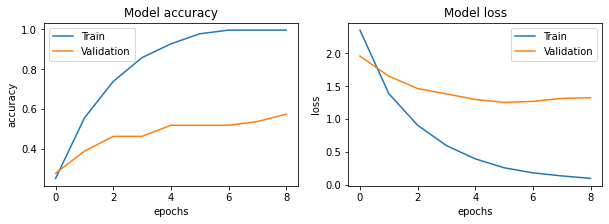

              Classification_report 
              precision    recall  f1-score   support

         0.1       0.58      0.58      0.58        12
         0.2       0.33      0.25      0.29         8
         0.5       0.40      0.67      0.50         6
           1       0.75      0.60      0.67        10
          10       0.80      0.80      0.80         5
         100       0.29      1.00      0.44         2
           2       1.00      0.67      0.80         3
          20       0.67      0.50      0.57         8
         200       0.33      1.00      0.50         1
           5       0.71      0.83      0.77         6
          50       1.00      0.29      0.44         7

    accuracy                           0.57        68
   macro avg       0.62      0.65      0.58        68
weighted avg       0.65      0.57      0.57        68

 Display 8 pictures of the dataset with their labels 


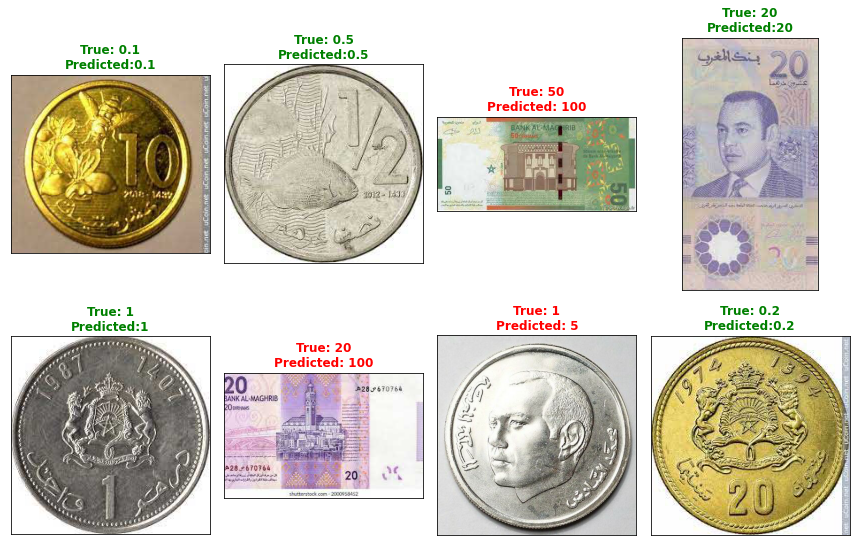

              Results 
    Test Loss:  1.13995  
Test Accuracy:  57.35%  


In [22]:
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.resnet_v2 import preprocess_input
result_ResNet101V2 = func(preprocess_input,ResNet101V2,100)
accuracy_test.append(result_ResNet101V2[1])

<a id="7"></a> <br>
# 📊 Final Report

In [23]:
model =['ResNet50','ResNet101','ResNet152','VGG16','VGG19','MobileNet',
 'MobileNetV2','DenseNet201 ','EfficientNetB7 ','InceptionV3','NASNetLarge','NASNetMobile ','ResNet101V2']
model = pd.Series(model, name='Model').astype(str)
acc_test = pd.Series(accuracy_test, name='Accuracy')
output = pd.concat([model, acc_test],axis=1)
output

,Model,Accuracy
0,ResNet50,0.647059
1,ResNet101,0.720588
2,ResNet152,0.705882
3,VGG16,0.617647
4,VGG19,0.617647
5,MobileNet,0.617647
6,MobileNetV2,0.602941
7,DenseNet201,0.676471
8,EfficientNetB7,0.573529
9,InceptionV3,0.529412


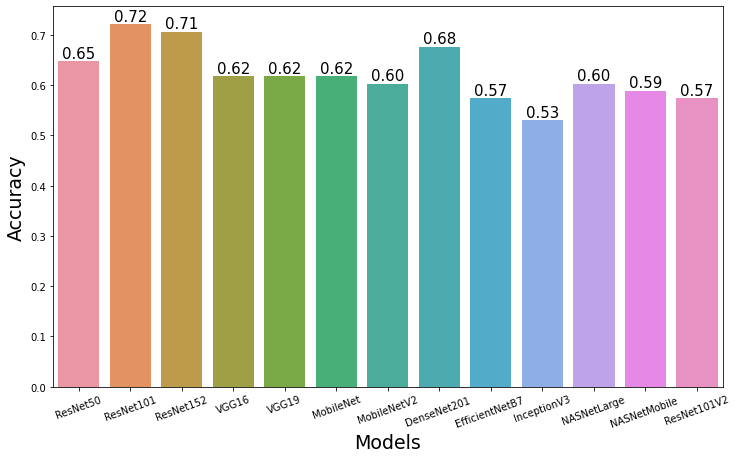

In [24]:
plt.figure(figsize=(12, 7))
plots = sns.barplot(x='Model', y='Accuracy', data=output)
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')

plt.xlabel("Models",fontsize=19)
plt.ylabel("Accuracy",fontsize=19)
plt.xticks(rotation=20);

<h1>Greatly appreciate to leave your comments /suggestions.</h1>
<h1>If you like this notebook please do <span style="color:green">UPVOTE</span>.</h1>